# NBA MVP Prediction

## Table of Contents
* [Import data/modules](#import-data)
* [Exploratory Data Analysis](#eda)
* [Preprocessing](#preprocessing)
* [Modeling](#modeling)
* [Forecasting 2022 MVP](#forecasting)

## Import data/modules <a class="anchor" id="import-data"></a>


In [1]:
#essentials
import os
import numpy as np
import pandas as pd
import dataframe_image as dfi
from tqdm import tqdm
import pickle
import warnings
warnings.filterwarnings('ignore')

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#tools/metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import train_test_split
import shap

#modeling
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

#pandas show all columns
pd.set_option('display.max_columns', None)

#%load_ext autoreload
#%autoreload 2
#%run ./__init__

### Read Data

In [2]:
data_path = os.path.dirname(os.getcwd()) + '/data' + '/master_table.csv'
master_table = pd.read_csv(data_path)

In [3]:
master_table.head()

,Rank,Player,Age,Tm,First,Pts Won,Pts Max,Share,G,MP,PTS,TRB,AST,STL,BLK,FG%,3P%,FT%,WS,WS/48,year,team,W,W/L%,seed,player_efficiency_rating,true_shooting_percentage,three_point_attempt_rate,free_throw_attempt_rate,offensive_rebound_percentage,defensive_rebound_percentage,total_rebound_percentage,assist_percentage,steal_percentage,block_percentage,turnover_percentage,usage_percentage,offensive_win_shares,defensive_win_shares,win_shares,win_shares_per_48_minutes,offensive_box_plus_minus,defensive_box_plus_minus,box_plus_minus,value_over_replacement_player
0,1,Kareem Abdul-Jabbar,32,LAL,147.0,147.0,221,0.665,82,38.3,24.8,10.8,4.5,1.0,3.4,0.604,0.000,0.765,14.8,0.227,1980,Los Angeles Lakers,60.0,0.732,1.0,25.3,0.639,0.001,0.344,7.2,22.2,15.4,16.5,1.2,4.6,15.7,24.1,9.5,5.3,14.8,0.227,4.8,2.4,7.2,7.3
1,2,Julius Erving,29,PHI,31.5,31.5,221,0.143,78,36.1,26.9,7.4,4.6,2.2,1.8,0.519,0.200,0.787,12.5,0.213,1980,Philadelphia 76ers,59.0,0.720,2.0,25.4,0.568,0.012,0.331,8.6,12.9,10.9,21.4,2.8,2.7,13.3,30.3,7.3,5.2,12.5,0.213,5.7,1.9,7.6,6.8
2,3,George Gervin,27,SAS,19.0,19.0,221,0.086,78,37.6,33.1,5.2,2.6,1.4,1.0,0.528,0.314,0.852,10.6,0.173,1980,San Antonio Spurs,41.0,0.500,4.5,24.0,0.587,0.053,0.306,5.7,8.9,7.3,11.0,1.6,1.4,10.3,31.7,9.3,1.3,10.6,0.173,5.5,-1.6,3.9,4.4
3,4,Larry Bird,23,BOS,15.0,15.0,221,0.068,82,36.0,21.3,10.4,4.5,1.7,0.6,0.474,0.406,0.836,11.2,0.182,1980,Boston Celtics,61.0,0.744,1.0,20.5,0.538,0.098,0.246,8.3,23.6,16.0,18.5,2.3,1.0,14.0,25.3,5.6,5.6,11.2,0.182,3.0,1.5,4.5,4.8
4,5T,Tiny Archibald,31,BOS,2.0,2.0,221,0.009,80,35.8,14.1,2.5,8.4,1.3,0.1,0.482,0.222,0.830,8.9,0.148,1980,Boston Celtics,61.0,0.744,1.0,15.3,0.574,0.023,0.548,2.3,5.3,3.8,30.2,1.7,0.2,19.7,17.0,5.9,2.9,8.9,0.148,1.4,-0.3,1.1,2.3


## Exploratory Data Analysis <a class="anchor" id="eda"></a>


In [4]:
master_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679 entries, 0 to 678
Data columns (total 45 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Rank                           679 non-null    object 
 1   Player                         679 non-null    object 
 2   Age                            679 non-null    int64  
 3   Tm                             679 non-null    object 
 4   First                          679 non-null    float64
 5   Pts Won                        679 non-null    float64
 6   Pts Max                        679 non-null    int64  
 7   Share                          679 non-null    float64
 8   G                              679 non-null    int64  
 9   MP                             679 non-null    float64
 10  PTS                            679 non-null    float64
 11  TRB                            679 non-null    float64
 12  AST                            679 non-null    flo

### Correlation Matrix

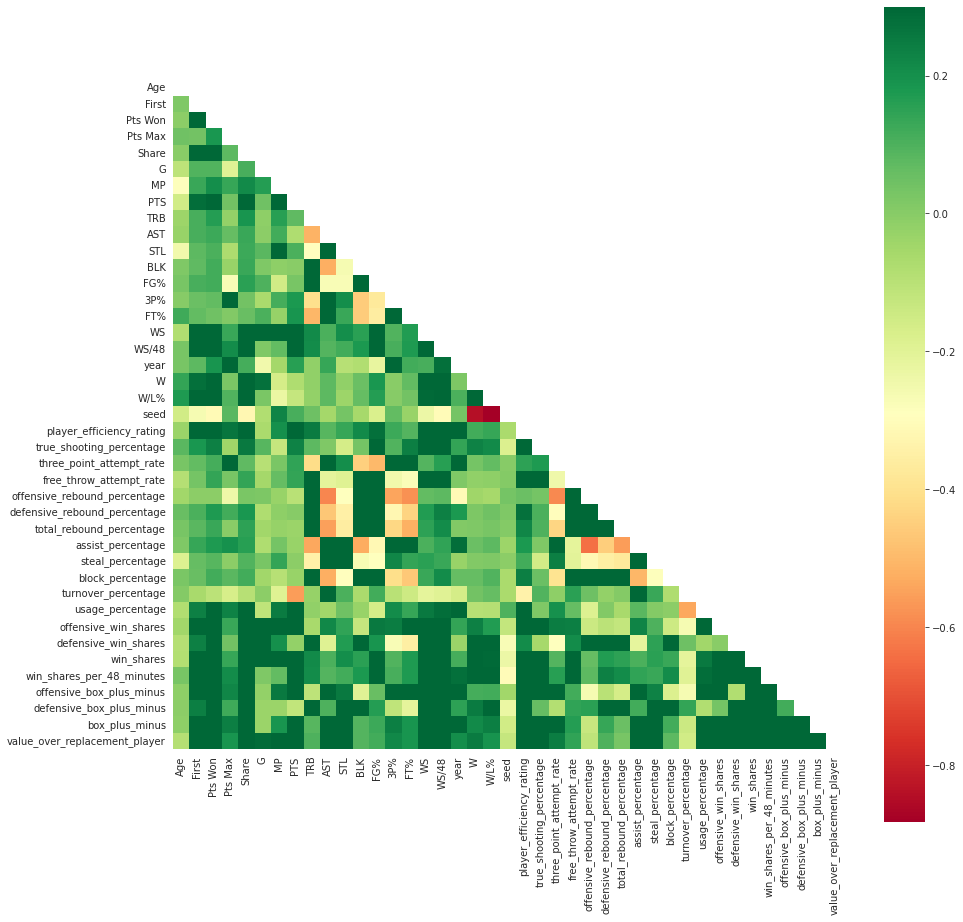

In [5]:
#correlations of each features
corr_matrix = master_table.corr()

#plot heat map
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 15))
    ax = sns.heatmap(corr_matrix, mask=mask, vmax=.3, square=True,cmap="RdYlGn")


### Mutual Information

Mutual information describes relationships in terms of uncertainty. The mutual information (MI) between two quantities is a measure of the extent to which knowledge of one quantity reduces uncertainty about the other

The least possible mutual information between quantities is 0.0. When MI is zero, the quantities are independent: neither can tell you anything about the other. Conversely, in theory there's no upper bound to what MI can be. In practice though values above 2.0 or so are uncommon. (Mutual information is a logarithmic quantity, so it increases very slowly.)

* MI can help you to understand the relative potential of a feature as a predictor of the target, considered by itself.
* It's possible for a feature to be very informative when interacting with other features, but not so informative all alone. MI can't detect interactions between features. It is a univariate metric.
* The actual usefulness of a feature depends on the model you use it with. A feature is only useful to the extent that its relationship with the target is one your model can learn. Just because a feature has a high MI score doesn't mean your model will be able to do anything with that information. You may need to transform the feature first to expose the association.



In [6]:
def calculate_ml_scores(df):
    X = df.copy()
    y = X["Share"]

    X.drop('Share', axis=1, inplace=True)

    # Label encoding for categoricals
    for colname in X.select_dtypes("object"):
        X[colname], _ = X[colname].factorize()

    # All discrete features should now have integer dtypes (double-check this before using MI!)
    discrete_features = X.dtypes == int
    
    mi_scores = mutual_info_regression(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return X, y, mi_scores

In [7]:
#drop columns for mutual information
to_drop_mi = ['Rank','Player','Age','year','Tm','team','First','Pts Won','Pts Max','WS','WS/48']
master_table_mi = master_table.copy()
master_table_mi.drop(to_drop_mi, axis=1, inplace=True)

In [8]:
X, y, mi_scores = calculate_ml_scores(df=master_table_mi)

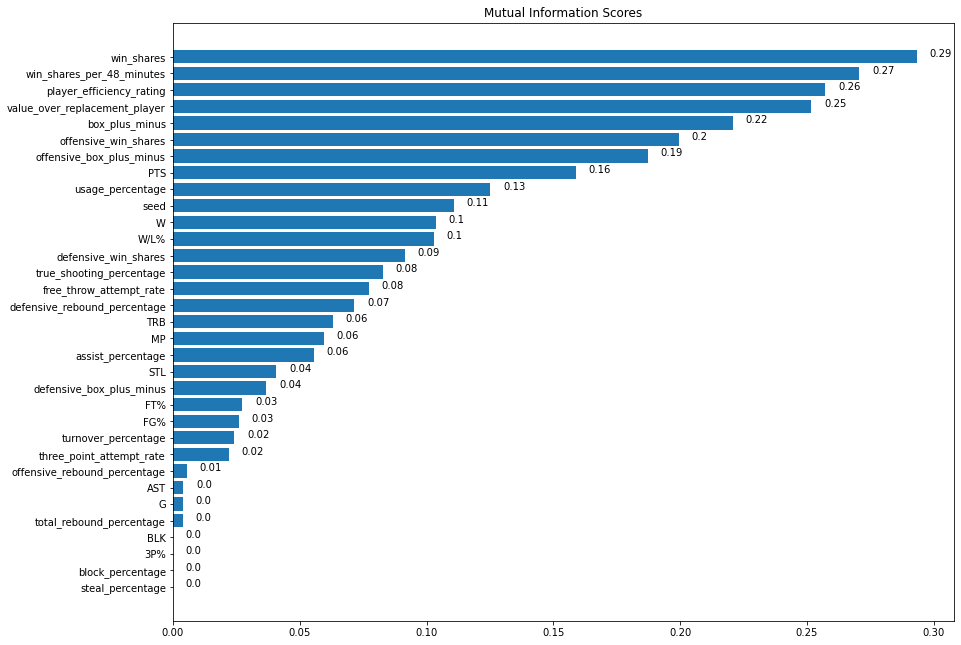

In [9]:
def plot_mi_scores(scores, figsize):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.barh(width, scores)
    
    for index, value in enumerate(scores):
        plt.text(value +0.005 , index, str(round(value,2)))
    
    plt.yticks(width, ticks)    
    plt.title("Mutual Information Scores")

plot_mi_scores(mi_scores, figsize=(14,11))

### Visualize significant features vs. MVP Shares

In [10]:
def add_win_lose_col(df):
    rank_lst = []
    for i in list(df['Rank']):
        if i == '1':
            rank_lst.append('won')
        else:
            rank_lst.append('lost')
    master_table_rank = df.copy()
    master_table_rank['Win/Lose'] = rank_lst
    return master_table_rank

In [11]:
def show_feature_vs_share(feature, df):
    fig = px.scatter(data_frame = df,
               x=feature,
               y='Share',
               color='Win/Lose',
               color_discrete_sequence=['blue','gray'], 
               hover_data={
                   'Win/Lose': False,
                   'Player': True, 
                   'year': True,
                   'seed': True,
                   'W/L%': True, 
                   'W': True
                   
               })
    fig.update_layout(height=500,
                     title = f"{feature} vs. MVP share")
    fig.show()

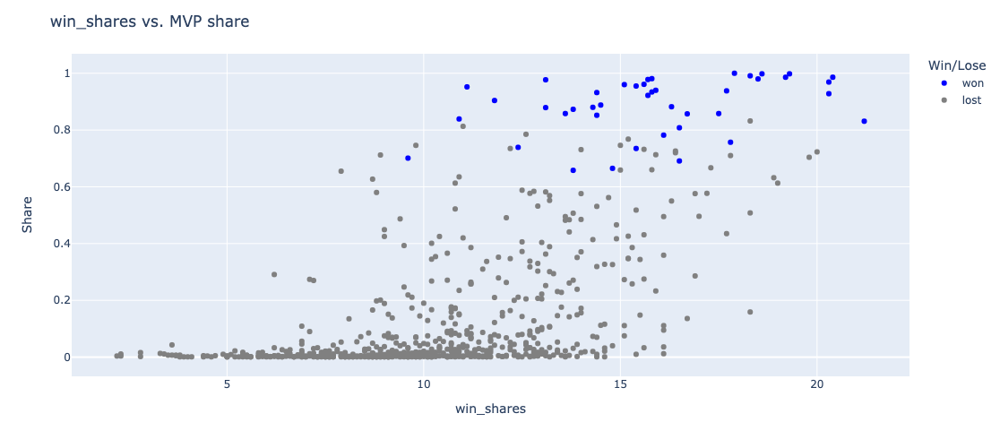

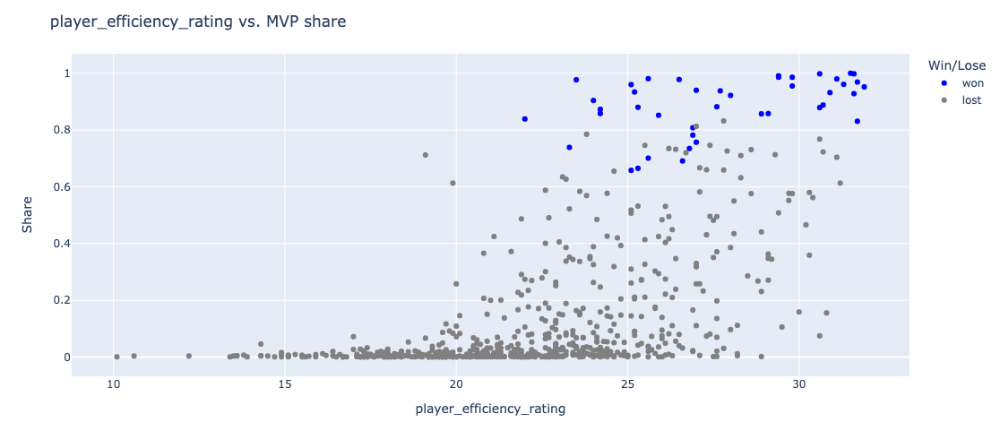

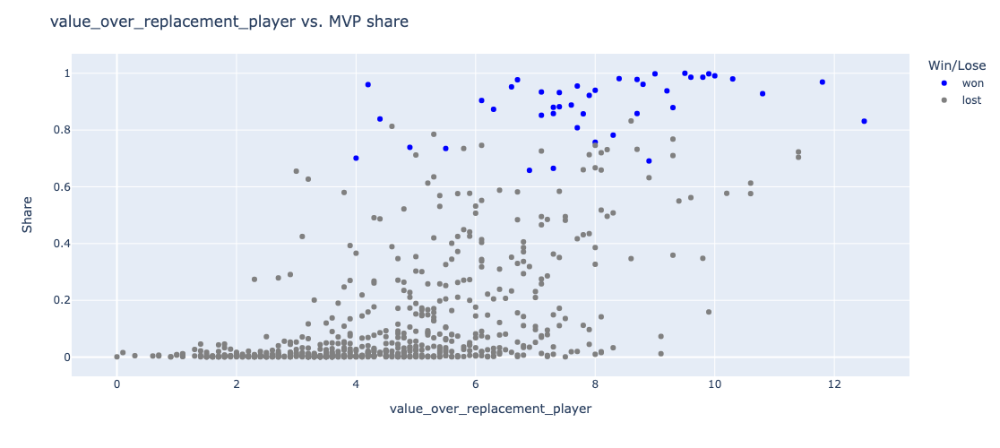

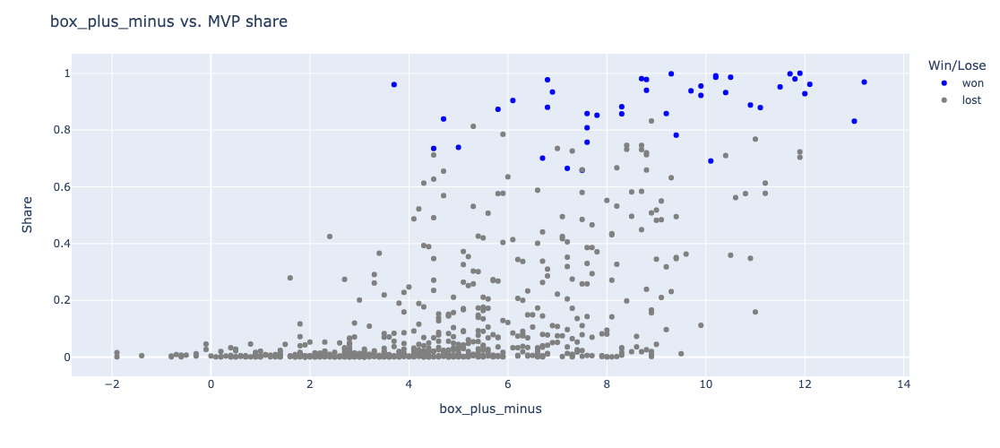

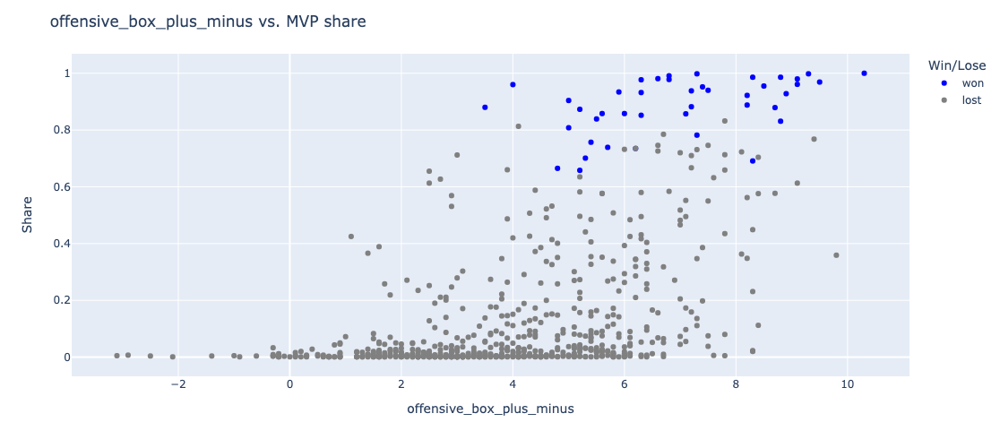

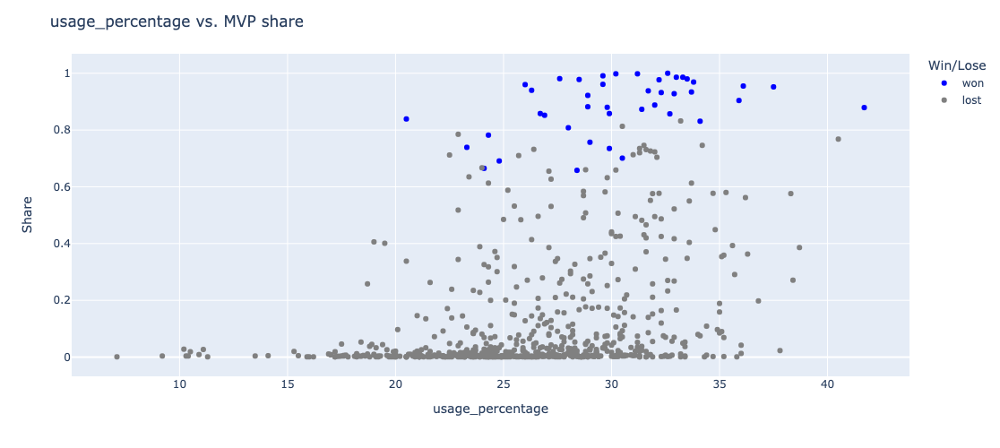

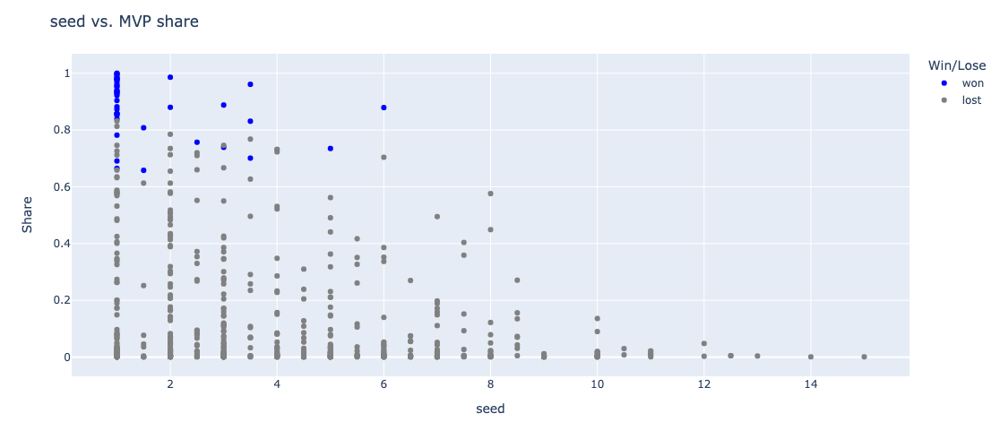

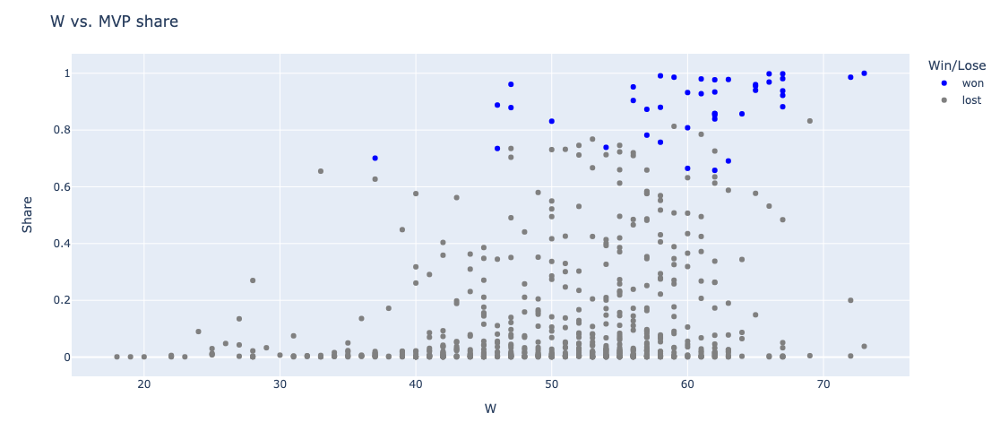

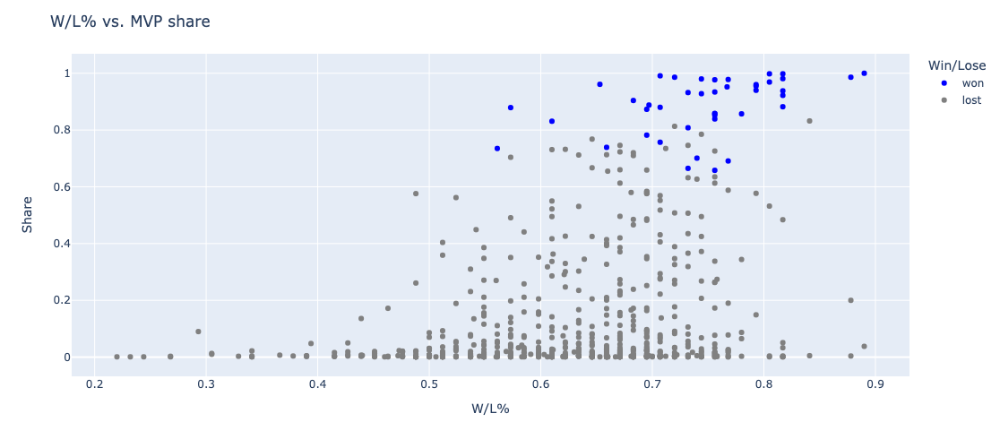

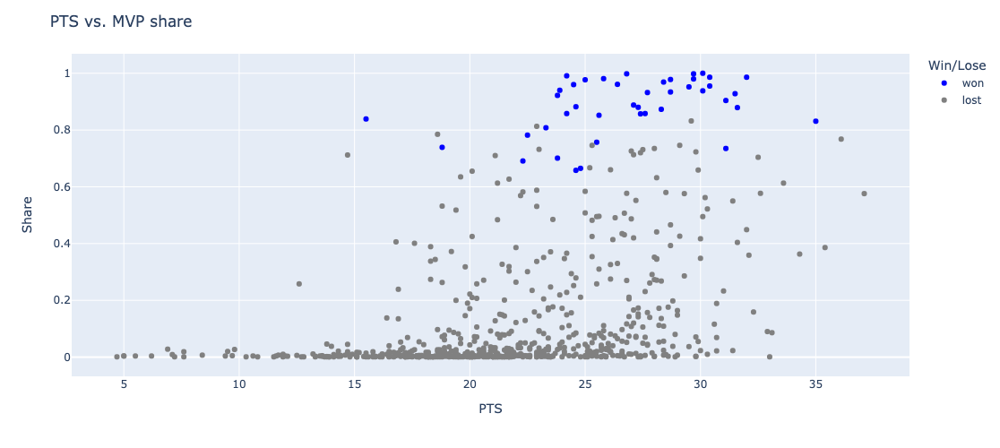

In [12]:
features = ['win_shares', 
            'player_efficiency_rating',
            'value_over_replacement_player',
            'box_plus_minus',
            'offensive_box_plus_minus',
            'usage_percentage',
            'seed',
            'W',
            'W/L%',
            'PTS']

master_table_rank = add_win_lose_col(df=master_table)

for feature in features:
    show_feature_vs_share(feature=feature, df=master_table_rank)

At this point these variables may seem to have somewhat linear relationship with the MVP share metric. It could be valid to consider them as model features as the experiments are conducted.

# Preprocessing <a class="anchor" id="preprocessing"></a>

drop unnecessary or redundant features

In [13]:
#drop columns 

to_drop = [
    'Rank',
    'Player',
    'Age',
    'year',
    'Tm',
    'team',
    'First',
    'Pts Won',
    'Pts Max',
    'WS/48',
    'WS',
    'MP',
    'G',
    'W', 
    'FG%',
    '3P%',
    'STL', 
    'BLK',
    'three_point_attempt_rate',
    'total_rebound_percentage',
    'offensive_rebound_percentage',
    'block_percentage',
    'defensive_rebound_percentage',
    'steal_percentage',
    'turnover_percentage',
    'assist_percentage',
    'AST',
    'TRB',
    #'free_throw_attempt_rate', ######### Experiment
    'FT%',
    'win_shares', 
    #'value_over_replacement_player', 
    'box_plus_minus', 
    #'offensive_box_plus_minus', 
    'defensive_box_plus_minus',
    'offensive_win_shares', 
    'defensive_win_shares', 
    'true_shooting_percentage' 
]

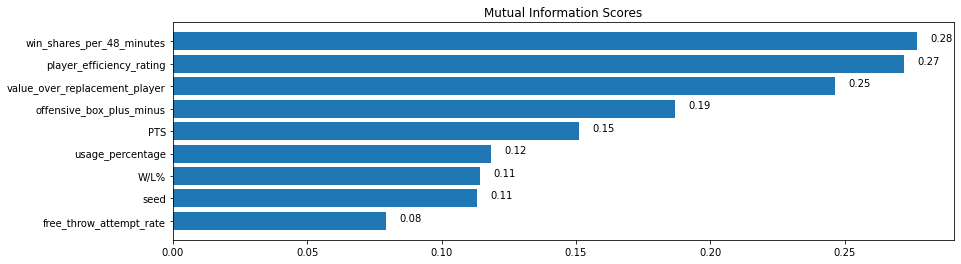

In [14]:
#run another Mutual Information Score analysis
master_table_mi2 = master_table.copy()
master_table_mi2.drop(to_drop, axis=1, inplace=True)
X, y, mi_scores2 = calculate_ml_scores(df=master_table_mi2)
plot_mi_scores(mi_scores2, figsize=(14,4))

## Modeling <a class="anchor" id="modeling"></a>

### Train/Test Split

test on selected year, train on all other years that weren't selected

In [15]:
def train_test_split_by_year(year, df, scaling=False):
    #test year = selected year, train year = other years outside of selected year
    train_df = df[df['year'] != year]
    test_df = df[df['year'] == year]
    
    train_df2 = train_df.copy()
    test_df2 = test_df.copy()
    
    train_df2.drop(to_drop, axis=1, inplace=True)
    test_df2.drop(to_drop, axis=1, inplace=True)
    
    if scaling == True:
        sc_X = StandardScaler()
        sc_y = StandardScaler()
        train_df2 = sc_X.fit_transform(train_df2)
        test_df2 = sc_y.fit_transform(test_df2)
    
    X_train = train_df2.copy()
    y_train = X_train["Share"]
    
    X_test = test_df2.copy()
    y_test = X_test["Share"]

    X_train.drop('Share', axis=1, inplace=True)
    cols = X_train.columns
    X_test.drop('Share', axis=1, inplace=True)

    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    return X_train, y_train, X_test, y_test, cols

### Model Helper Functions

train, predict, calculate MAE & R squared, show actual vs. predicted in a dataframe

In [16]:
def run_model(regressor, X_train, y_train, X_test, y_test, df, year):
    model = regressor
    model.fit(X_train, y_train) 
    predictions = model.predict(X_test)
    mae = mean_absolute_error(predictions, y_test)
    r2 = r2_score(y_test, predictions)
    
    mvp_race = df[df['year'] == year]
    mvp_race['predicted_share'] = predictions
    mvp_race = mvp_race.sort_values(["Share", "predicted_share"], ascending = (False, False))
                                    
    actual_winner = mvp_race[mvp_race['Share'] == mvp_race['Share'].max()]['Player']
    predicted_winner = mvp_race[mvp_race['predicted_share'] == mvp_race['predicted_share'].max()]['Player']
    return model, mae, r2, predicted_winner.iloc[0], actual_winner.iloc[0], mvp_race

find average metrics and overall accuracy

In [17]:
years = [year for year in range(1980, 2022)]

def run_model_average(df, regressor, scaling=False, print_metrics=False):
    mae_lst = []
    r2_lst = []
    predicted_lst = []
    actual_lst = []
    label_lst =[]
    model_lst = []
    for year in tqdm(years):
        X_train, y_train, X_test, y_test, cols = train_test_split_by_year(year=year, df=df, scaling=False)
        model, mae, r2, predicted_winner, actual_winner, mvp_race = run_model(regressor,
                                                             X_train,
                                                              y_train,
                                                              X_test,
                                                              y_test,
                                                              df=df,
                                                              year=year,
                                                            )
        if predicted_winner == actual_winner:
            label = 'correct'
        else:
            label = 'incorrect'
        mae_lst.append(mae)
        r2_lst.append(r2)
        predicted_lst.append(predicted_winner)
        actual_lst.append(actual_winner)
        label_lst.append(label)
        model_lst.append(model)
    d = {
    'year': years,
    'MAE': mae_lst,
    'R squared': r2_lst,
    'Predicted MVP': predicted_lst,
    'Actual MVP': actual_lst,
    'Label': label_lst
    }

    summary = pd.DataFrame(d)
    correct_count = summary['Label'].value_counts().iloc[0]
    incorrect_count = summary['Label'].value_counts().iloc[1]
    accuracy = correct_count / (correct_count + incorrect_count)
    avg_mae = summary['MAE'].mean()
    avg_r2  = summary['R squared'].mean()
    
    if print_metrics == True:
        print(f"Average MAE: {avg_mae}")
        print(f"Average R squared: {avg_r2}")
        print(f"Prediction accuracy: {accuracy}")
    return avg_mae, avg_r2, accuracy, summary, model_lst, cols

### Models
* Linear Regression
* Random Forest Regressor
* XGBoost Regressor
* LightGBM Regressor

(see parameter_tuning.ipynb for parameter tuning scripts)

#### Linear Regression

In [18]:
lr_avg_mae, lr_avg_r2, lr_accuracy, lr_summary, lr_models, cols = run_model_average(df=master_table,
                  regressor = LinearRegression(),
                 scaling=True,
                print_metrics=True)

100%|██████████| 42/42 [00:00<00:00, 129.83it/s]

Average MAE: 0.14528095583827477
Average R squared: 0.4716945918885495
Prediction accuracy: 0.6428571428571429


#### Random Forest Regressor

In [19]:
#display feature importance for tree algorithms (RF, XGB, LGBM
def avg_feature_importance(models, cols):
    lst = []
    for model in models:
        feature_importance = list(model.feature_importances_)
        lst.append(feature_importance)
        
    df = pd.DataFrame(lst, columns=cols)
    mean_features = df.mean()
    
    #df2 = pd.DataFrame([cols ,mean_features], columns=['Feature', 'Feature Importance'])
    df2 = pd.DataFrame([cols ,mean_features]).T
    df2 = df2.rename(columns={0:'Feature', 1:'Score'}).sort_values(by='Score', ascending=False)
    
    #plt.rcParams["figure.figsize"] = (7,4)
    plt.title('Feature Importance Score')
    sns.barplot(x='Score',
                y= 'Feature',
               data=df2,
                  )
    plt.show()

In [20]:
rf_avg_mae, rf_avg_r2, rf_accuracy, rf_summary, rf_models, rf_cols = run_model_average(df=master_table,
                  regressor=RandomForestRegressor(n_estimators = 23, 
                                                  random_state = 0, 
                                                  max_depth=7, 
                                                  min_samples_leaf=1,
                                                  min_samples_split=2),
                print_metrics=True)

100%|██████████| 42/42 [00:02<00:00, 18.39it/s]

Average MAE: 0.10402398323666445
Average R squared: 0.6079918227884213
Prediction accuracy: 0.7380952380952381


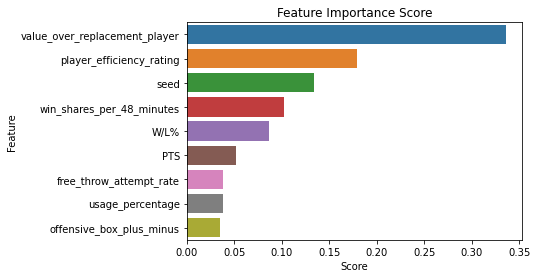

In [21]:
avg_feature_importance(models=rf_models, cols=rf_cols)

#### XGBoost

In [22]:
#BEST MODEL
# 16 5, 0.2745

xgb_avg_mae, xgb_avg_r2, xgb_accuracy, xgb_summary, xgb_models, xgb_cols = run_model_average(df=master_table,
                  regressor = XGBRegressor(n_estimators=16, max_depth=5, learning_rate = 0.2745, subsample=1, colsample_bytree=1),
                 scaling=False, print_metrics=True)

100%|██████████| 42/42 [00:01<00:00, 32.10it/s]

Average MAE: 0.10327332429727709
Average R squared: 0.6062658034118551
Prediction accuracy: 0.8333333333333334


In [23]:
xgb_summary

,year,MAE,R squared,Predicted MVP,Actual MVP,Label
0,1980,0.068104,0.711039,Kareem Abdul-Jabbar,Kareem Abdul-Jabbar,correct
1,1981,0.044850,0.605227,Julius Erving,Julius Erving,correct
2,1982,0.079323,0.264734,Magic Johnson,Moses Malone,incorrect
3,1983,0.078697,0.458365,Moses Malone,Moses Malone,correct
4,1984,0.089311,0.552824,Larry Bird,Larry Bird,correct
5,1985,0.043589,0.896859,Larry Bird,Larry Bird,correct
6,1986,0.092436,0.706484,Larry Bird,Larry Bird,correct
7,1987,0.071820,0.709262,Magic Johnson,Magic Johnson,correct
8,1988,0.092211,0.652065,Michael Jordan,Michael Jordan,correct
9,1989,0.064810,0.822390,Magic Johnson,Magic Johnson,correct


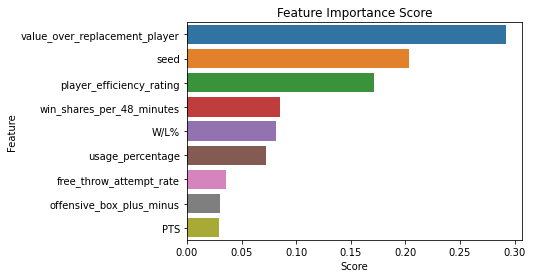

In [24]:
avg_feature_importance(models=xgb_models, cols=xgb_cols)

In [25]:
xgb_summary

,year,MAE,R squared,Predicted MVP,Actual MVP,Label
0,1980,0.068104,0.711039,Kareem Abdul-Jabbar,Kareem Abdul-Jabbar,correct
1,1981,0.044850,0.605227,Julius Erving,Julius Erving,correct
2,1982,0.079323,0.264734,Magic Johnson,Moses Malone,incorrect
3,1983,0.078697,0.458365,Moses Malone,Moses Malone,correct
4,1984,0.089311,0.552824,Larry Bird,Larry Bird,correct
5,1985,0.043589,0.896859,Larry Bird,Larry Bird,correct
6,1986,0.092436,0.706484,Larry Bird,Larry Bird,correct
7,1987,0.071820,0.709262,Magic Johnson,Magic Johnson,correct
8,1988,0.092211,0.652065,Michael Jordan,Michael Jordan,correct
9,1989,0.064810,0.822390,Magic Johnson,Magic Johnson,correct


In [26]:
#export as image
dfi.export(xgb_summary,'xgboost_summary.png')

#### LightGBM

In [27]:
lgbm_avg_mae, lgbm_avg_r2, lgbm_accuracy, lgbm_summary, lgbm_models, lgbm_cols = run_model_average(df=master_table,
                  regressor = LGBMRegressor(n_estimators=23,
                                            max_depth=4,
                                            learning_rate=0.15,
                                            num_leaves=28,
                                            boosting_type='goss',
                                            random_state = 0,
                                           ),
                 scaling=False, print_metrics=True)


100%|██████████| 42/42 [00:01<00:00, 32.66it/s]

Average MAE: 0.10605503800455611
Average R squared: 0.6119918538779787
Prediction accuracy: 0.7619047619047619


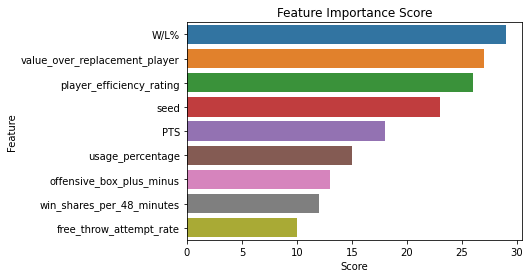

In [28]:
avg_feature_importance(models=lgbm_models, cols=lgbm_cols)

#### Model Summaries

In [29]:
d = {
    'Model': ['Linear Regression', 'Random Forest Regressor', 'XGBoost Regressor', 'LGBM Regressor'],
    'average MAE': [lr_avg_mae,rf_avg_mae, xgb_avg_mae, lgbm_avg_mae],
    'average R squared': [lr_avg_r2,rf_avg_r2, xgb_avg_r2, lgbm_avg_r2],
    'accuracy': [lr_accuracy,rf_accuracy, xgb_accuracy, lgbm_accuracy],
}
model_summary_df = pd.DataFrame(d)
model_summary_df.style.highlight_max(subset = ['average R squared', 'accuracy'],
                       color = 'lightgreen', axis = 0)

,Model,average MAE,average R squared,accuracy
0,Linear Regression,0.145281,0.471695,0.642857
1,Random Forest Regressor,0.104024,0.607992,0.738095
2,XGBoost Regressor,0.103273,0.606266,0.833333
3,LGBM Regressor,0.106055,0.611992,0.761905


Best Models: 

In [30]:
#all models in models list have same parameters
best_xgb_model = xgb_models[0]
best_rf_model = rf_models[0]
best_lgbm_model = lgbm_models[0]

### Validate specific year 

The following function can be used to check details on a specific year's MVP race along with its predictions from the model 
* see 'Share' for actual share from the specific year's MVP race
* see 'predicted_share' for model's predicted share

In [31]:
def validate_year(year):
    X_train, y_train, X_test, y_test, cols = train_test_split_by_year(year, df=master_table, scaling=False)
    model, mae, r2, predicted_winner, actual_winner, mvp_race = run_model(best_xgb_model,
                                              X_train, y_train, X_test, y_test, df=master_table, year=year)
    # shift column 'Name' to first position
    nineth_column = mvp_race.pop('predicted_share')
    # first_column) function
    mvp_race.insert(8, 'predicted_share', nineth_column)
    mvp_race = mvp_race.reset_index(drop=True)

    X_test_df = pd.DataFrame(columns=cols, data = X_test)
    
    print(f'Predicted: {predicted_winner}')
    print(f'Actual: {actual_winner}')
    avg_feature_importance(models=[model], cols=cols)
    
    return model, X_test_df, mvp_race #mvp_race.style.highlight_max(subset = ['Share', 'predicted_share'], color = 'lightgreen', axis = 0)

In [32]:
def visualize_shap_values(mvp_race, model):
    top_candidates = list(mvp_race.head(3)['Player'])

    for idx, player in enumerate(top_candidates):
        data_for_prediction = mvp_race[mvp_race['Player'] == player]
        data_for_prediction = data_for_prediction[list(xgb_cols)]
        data_for_prediction_array = data_for_prediction.values.reshape(1, -1)
        rank = idx + 1
        print(f"Rank: {rank}: {player}")

        # Create object that can calculate shap values
        explainer = shap.TreeExplainer(model)
        # Calculate Shap values
        shap_values = explainer.shap_values(data_for_prediction_array)
        shap.initjs()
        display(shap.force_plot(explainer.expected_value, shap_values, data_for_prediction))

Predicted: Derrick Rose
Actual: Derrick Rose


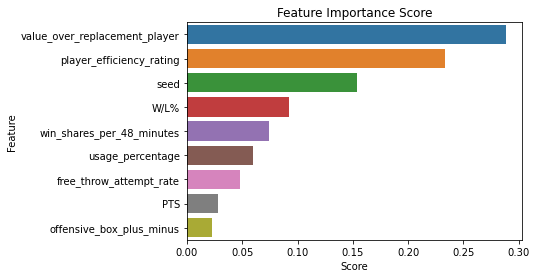

In [33]:
model, X_test_df, mvp_race = validate_year(year=2011)

In [34]:
visualize_shap_values(mvp_race, model)

Rank: 1: Derrick Rose


Rank: 2: Dwight Howard


Rank: 3: LeBron James


## Forecasting 2022 MVP <a class="anchor" id="forecasting"></a>

In [35]:
#data to be forecasted: 2022 mvp candidates from NBA's MVP ladder
data_path_2022 = os.path.dirname(os.getcwd()) + '/data' + '/data_2022.csv'
data_2022 = pd.read_csv(data_path_2022)
data_2022_cleaned = data_2022.copy()
data_2022_cleaned = data_2022_cleaned[list(xgb_cols)]

In [36]:
data_2022

,Player,games_played,team,PTS,AST,STL,BLK,FG%,3P%,TRB,Tm,W,W/L%,seed,player_efficiency_rating,true_shooting_percentage,three_point_attempt_rate,free_throw_attempt_rate,offensive_rebound_percentage,defensive_rebound_percentage,total_rebound_percentage,assist_percentage,steal_percentage,block_percentage,turnover_percentage,usage_percentage,offensive_win_shares,defensive_win_shares,win_shares,win_shares_per_48_minutes,offensive_box_plus_minus,defensive_box_plus_minus,box_plus_minus,value_over_replacement_player
0,Giannis Antetokounmpo,38,milwaukee bucks,28.578947,6.105263,1.026316,1.473684,0.532578,0.287671,11.263158,MIL,28,0.596,4,31.1,0.613,0.207,0.578,6.0,29.5,18.0,34.9,1.5,4.5,13.1,35.2,4.8,2.3,7.1,0.276,6.8,3.6,10.4,8.415789
1,Stephen Curry,41,golden state warriors,26.365854,6.073171,1.463415,0.463415,0.423030,0.385496,5.365854,GSW,32,0.711,2,22.0,0.593,0.635,0.239,1.9,14.5,8.4,30.0,2.1,1.3,12.9,32.0,3.1,2.6,5.6,0.191,6.1,0.9,6.9,6.400000
2,DeMar DeRozan,40,chicago bulls,25.725000,4.850000,0.800000,0.375000,0.488889,0.347222,4.950000,CHI,28,0.651,1,22.4,0.573,0.094,0.393,2.4,13.4,7.9,23.6,1.1,0.9,8.9,31.2,3.6,1.0,4.5,0.157,2.9,-1.1,1.7,2.665000
3,Kevin Durant,36,brooklyn nets,29.250000,5.750000,0.777778,0.944444,0.519890,0.372222,7.416667,BKN,28,0.636,3,26.1,0.626,0.247,0.350,1.7,19.4,10.9,27.5,1.0,2.3,11.3,31.2,4.4,1.4,5.9,0.215,6.6,0.6,7.3,7.061111
4,Joel Embiid,33,philadelphia 76ers,28.030303,4.151515,1.060606,1.393939,0.494157,0.375000,10.575758,PHI,26,0.591,5,30.7,0.612,0.187,0.594,6.4,29.0,17.9,23.5,1.6,3.9,11.3,35.6,3.9,1.8,5.7,0.254,6.7,1.9,8.5,7.206061
5,Rudy Gobert,40,utah jazz,15.850000,1.125000,0.800000,2.275000,0.713376,0.000000,15.025000,UTA,29,0.644,4,25.5,0.732,0.003,0.863,12.5,36.7,25.1,5.1,1.2,6.0,14.6,16.9,4.8,2.7,7.5,0.277,3.2,2.0,5.3,4.920000
6,LeBron James,33,los angeles lakers,28.848485,6.424242,1.606061,1.121212,0.516739,0.363985,7.606061,LAL,22,0.489,8,27.0,0.616,0.380,0.284,3.2,18.5,10.9,31.4,2.1,2.8,11.7,31.0,3.7,1.5,5.2,0.207,7.1,1.3,8.4,7.951515
7,Nikola Jokic,38,denver nuggets,25.921053,7.421053,1.368421,0.789474,0.569094,0.367089,13.947368,DEN,23,0.535,6,32.9,0.646,0.235,0.303,9.6,36.9,23.5,42.2,2.1,2.2,15.3,32.1,5.2,2.4,7.6,0.291,9.3,4.7,14.0,10.789474
8,Ja Morant,34,memphis grizzlies,24.676471,6.911765,1.264706,0.411765,0.485179,0.358108,5.764706,MEM,31,0.660,3,24.5,0.572,0.231,0.329,4.0,15.0,9.3,35.8,1.9,1.2,12.9,31.7,2.9,1.2,4.0,0.175,5.9,0.0,5.8,5.305882
9,Chris Paul,44,phoenix suns,14.022727,10.000000,1.931818,0.340909,0.478528,0.320611,4.295455,PHO,35,0.795,1,20.5,0.566,0.268,0.260,1.1,12.6,7.0,43.2,2.9,0.9,15.2,19.5,3.8,2.5,6.3,0.214,2.6,2.4,5.0,4.659091


In [37]:
def prep_train_test(df):
    #train; using hitorical data from 1980 - 2021
    forecast_X_train_df = df.copy()
    forecast_X_train_df.drop(to_drop, axis=1, inplace=True)
    forecast_y_train_df = forecast_X_train_df['Share']
    forecast_X_train_df.drop(['Share'], axis=1, inplace=True)
    
    #data to be forecasted: 2022 mvp candidates from NBA's MVP ladder
    forecast_X_test_df = data_2022_cleaned
    
    print(f'Training dataset columns: \n{list(forecast_X_train_df.columns)} \n')
    print(f'Forecasting dataset columns: \n{list(forecast_X_test_df.columns)}')
    return forecast_X_train_df, forecast_y_train_df, forecast_X_test_df

In [38]:
def fit_forecast_model(regressor):
    model = regressor
    model.fit(forecast_X_train_df, forecast_y_train_df) 
    predictions = model.predict(forecast_X_test_df)
    
    mvp_race_forecast = data_2022.copy()
    mvp_race_forecast['Share Prediction'] = predictions
    mvp_race_forecast = mvp_race_forecast.sort_values(["Share Prediction"], ascending = (False))
    
    mvp_race_forecast_sub = mvp_race_forecast[[
                                                'Player',
                                                'Share Prediction',
                                                'PTS',
                                               'value_over_replacement_player',
                                               'seed',
                                                'W/L%',
                                               'player_efficiency_rating',
                                               'win_shares_per_48_minutes',
                                                'offensive_box_plus_minus',
                                                'usage_percentage',
                                            'free_throw_attempt_rate'
                                              ]].reset_index(drop=True)
    mvp_race_forecast_sub.head()
    avg_feature_importance(models=[model], cols=data_2022_cleaned.columns)
    return model, mvp_race_forecast_sub

In [39]:
def show_highlighted_df(df):
    return df.style.highlight_max(subset = ['value_over_replacement_player',
                                                    'player_efficiency_rating',
                                                    'W/L%',
                                                    'win_shares_per_48_minutes',
                                                    'usage_percentage',
                                                    'free_throw_attempt_rate',
                                                    'offensive_box_plus_minus',
                                                    'PTS',
                                                    'Share Prediction'], color = 'lightgreen', axis = 0)

In [40]:
#train on historical data, predict on 2022 data
forecast_X_train_df, forecast_y_train_df, forecast_X_test_df = prep_train_test(df=master_table)

Training dataset columns: 
['PTS', 'W/L%', 'seed', 'player_efficiency_rating', 'free_throw_attempt_rate', 'usage_percentage', 'win_shares_per_48_minutes', 'offensive_box_plus_minus', 'value_over_replacement_player'] 

Forecasting dataset columns: 
['PTS', 'W/L%', 'seed', 'player_efficiency_rating', 'free_throw_attempt_rate', 'usage_percentage', 'win_shares_per_48_minutes', 'offensive_box_plus_minus', 'value_over_replacement_player']


NOTE: **VORP** (value_over_replacement_player) metric for 2022 candidates has been adjusted as a projection considering the games left in the season. 

### Model 1: XGBoost

In [41]:
best_xgb_model

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.2745, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=16, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

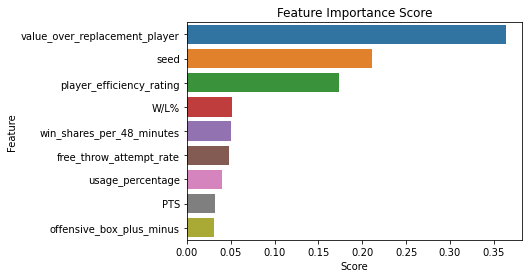

In [42]:
#best xgb model
xgb_model, xgb_mvp_race_forecast = fit_forecast_model(regressor = XGBRegressor(
                                            n_estimators=16,
                                            max_depth=5,
                                            learning_rate=0.2745))

# 16 5, 0.2745



In [43]:
show_highlighted_df(df=xgb_mvp_race_forecast)

,Player,Share Prediction,PTS,value_over_replacement_player,seed,W/L%,player_efficiency_rating,win_shares_per_48_minutes,offensive_box_plus_minus,usage_percentage,free_throw_attempt_rate
0,Giannis Antetokounmpo,0.590303,28.578947,8.415789,4,0.596000,31.100000,0.276000,6.800000,35.200000,0.578000
1,Nikola Jokic,0.429850,25.921053,10.789474,6,0.535000,32.900000,0.291000,9.300000,32.100000,0.303000
2,Stephen Curry,0.342355,26.365854,6.400000,2,0.711000,22.000000,0.191000,6.100000,32.000000,0.239000
3,Rudy Gobert,0.332459,15.850000,4.920000,4,0.644000,25.500000,0.277000,3.200000,16.900000,0.863000
4,Kevin Durant,0.311178,29.250000,7.061111,3,0.636000,26.100000,0.215000,6.600000,31.200000,0.350000
5,Joel Embiid,0.271014,28.030303,7.206061,5,0.591000,30.700000,0.254000,6.700000,35.600000,0.594000
6,Ja Morant,0.171785,24.676471,5.305882,3,0.660000,24.500000,0.175000,5.900000,31.700000,0.329000
7,LeBron James,0.135741,28.848485,7.951515,8,0.489000,27.000000,0.207000,7.100000,31.000000,0.284000
8,Chris Paul,0.112030,14.022727,4.659091,1,0.795000,20.500000,0.214000,2.600000,19.500000,0.260000
9,DeMar DeRozan,0.099873,25.725000,2.665000,1,0.651000,22.400000,0.157000,2.900000,31.200000,0.393000


In [44]:
visualize_shap_values(model= xgb_model, mvp_race=xgb_mvp_race_forecast)

Rank: 1: Giannis Antetokounmpo


Rank: 2: Nikola Jokic


Rank: 3: Stephen Curry


### Model 2: Random Forest

In [45]:
best_rf_model

RandomForestRegressor(max_depth=7, n_estimators=23, random_state=0)

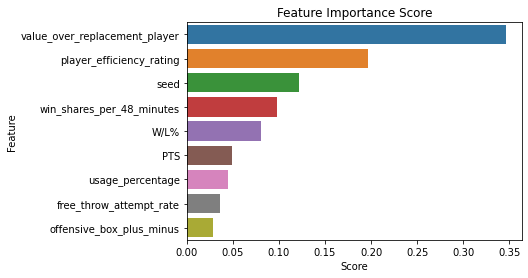

In [46]:
#best random forest model
rf_model, rf_mvp_race_forecast = fit_forecast_model(regressor = RandomForestRegressor(n_estimators = 23, 
                                                  random_state = 0, 
                                                  max_depth=7, 
                                                  min_samples_leaf=1,
                                                  min_samples_split=2)
                  )

In [47]:
show_highlighted_df(df=rf_mvp_race_forecast)

,Player,Share Prediction,PTS,value_over_replacement_player,seed,W/L%,player_efficiency_rating,win_shares_per_48_minutes,offensive_box_plus_minus,usage_percentage,free_throw_attempt_rate
0,Giannis Antetokounmpo,0.586578,28.578947,8.415789,4,0.596000,31.100000,0.276000,6.800000,35.200000,0.578000
1,Nikola Jokic,0.473432,25.921053,10.789474,6,0.535000,32.900000,0.291000,9.300000,32.100000,0.303000
2,Kevin Durant,0.292997,29.250000,7.061111,3,0.636000,26.100000,0.215000,6.600000,31.200000,0.350000
3,LeBron James,0.272679,28.848485,7.951515,8,0.489000,27.000000,0.207000,7.100000,31.000000,0.284000
4,Joel Embiid,0.267902,28.030303,7.206061,5,0.591000,30.700000,0.254000,6.700000,35.600000,0.594000
5,Rudy Gobert,0.258348,15.850000,4.920000,4,0.644000,25.500000,0.277000,3.200000,16.900000,0.863000
6,Stephen Curry,0.246855,26.365854,6.400000,2,0.711000,22.000000,0.191000,6.100000,32.000000,0.239000
7,DeMar DeRozan,0.181895,25.725000,2.665000,1,0.651000,22.400000,0.157000,2.900000,31.200000,0.393000
8,Ja Morant,0.177750,24.676471,5.305882,3,0.660000,24.500000,0.175000,5.900000,31.700000,0.329000
9,Chris Paul,0.043428,14.022727,4.659091,1,0.795000,20.500000,0.214000,2.600000,19.500000,0.260000


In [48]:
visualize_shap_values(model = rf_model, mvp_race= rf_mvp_race_forecast)

Rank: 1: Giannis Antetokounmpo


Rank: 2: Nikola Jokic


Rank: 3: Kevin Durant


#### Model 3 LightGBM

In [49]:
best_lgbm_model

LGBMRegressor(boosting_type='goss', learning_rate=0.15, max_depth=4,
              n_estimators=23, num_leaves=28, random_state=0)

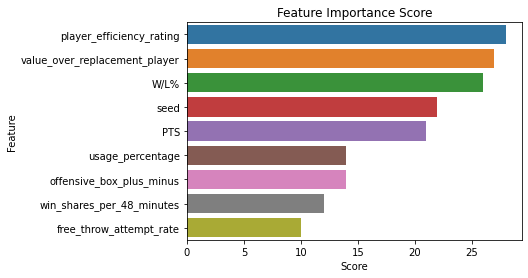

In [50]:
#best LightGBM model
lgbm_model, lgbm_mvp_race_forecast = fit_forecast_model(
                                                regressor = LGBMRegressor(
                                                                    n_estimators=23,
                                                                    max_depth=4,
                                                                    learning_rate=0.15,
                                                                    num_leaves=28,
                                                                    boosting_type='goss',
                                                                    random_state = 0,
                                           ))

In [51]:
show_highlighted_df(df=lgbm_mvp_race_forecast)

,Player,Share Prediction,PTS,value_over_replacement_player,seed,W/L%,player_efficiency_rating,win_shares_per_48_minutes,offensive_box_plus_minus,usage_percentage,free_throw_attempt_rate
0,Giannis Antetokounmpo,0.574859,28.578947,8.415789,4,0.596000,31.100000,0.276000,6.800000,35.200000,0.578000
1,Nikola Jokic,0.555140,25.921053,10.789474,6,0.535000,32.900000,0.291000,9.300000,32.100000,0.303000
2,LeBron James,0.442188,28.848485,7.951515,8,0.489000,27.000000,0.207000,7.100000,31.000000,0.284000
3,Joel Embiid,0.320379,28.030303,7.206061,5,0.591000,30.700000,0.254000,6.700000,35.600000,0.594000
4,Stephen Curry,0.310865,26.365854,6.400000,2,0.711000,22.000000,0.191000,6.100000,32.000000,0.239000
5,Kevin Durant,0.260141,29.250000,7.061111,3,0.636000,26.100000,0.215000,6.600000,31.200000,0.350000
6,Ja Morant,0.183473,24.676471,5.305882,3,0.660000,24.500000,0.175000,5.900000,31.700000,0.329000
7,Rudy Gobert,0.110423,15.850000,4.920000,4,0.644000,25.500000,0.277000,3.200000,16.900000,0.863000
8,DeMar DeRozan,0.098157,25.725000,2.665000,1,0.651000,22.400000,0.157000,2.900000,31.200000,0.393000
9,Chris Paul,0.079924,14.022727,4.659091,1,0.795000,20.500000,0.214000,2.600000,19.500000,0.260000


In [52]:
visualize_shap_values(model = lgbm_model, mvp_race= lgbm_mvp_race_forecast)

Rank: 1: Giannis Antetokounmpo


Rank: 2: Nikola Jokic


Rank: 3: LeBron James


#### MVP Prediction Summary

In [53]:
forecast_tables = [xgb_mvp_race_forecast, lgbm_mvp_race_forecast, rf_mvp_race_forecast]
model_names = ['XGBoost', 'LightGBM', 'Random Forest']

tables = []
for name, forecast_table in zip(model_names, forecast_tables):
    player_sub = forecast_table.head(5)[['Player']]
    player_sub['Rank'] = ['1st Place','2nd Place','3rd Place','4th Place','5th Place']
    player_sub2 = player_sub.T.reset_index(drop=True)
    player_sub2.columns = player_sub2.iloc[1]
    player_sub2.drop(player_sub2.tail(1).index,inplace=True)

    share_sub = forecast_table.head(5)[['Share Prediction']]
    share_sub['Rank'] = ['1st Place Share','2nd Place Share','3rd Place Share', '4th Place Share', '5th Place Share']
    
    share_sub2 = share_sub.T.reset_index(drop=True)
    share_sub2.columns = share_sub2.iloc[1]
    share_sub2.drop(share_sub2.tail(1).index,inplace=True)

    merged_df = pd.concat([player_sub2, share_sub2], axis=1).sort_index(axis=1)
    merged_df['Model'] = name
    tables.append(merged_df)
    
final_summary_table = pd.concat(tables)
# shift column 'Name' to first position
first_column = final_summary_table.pop('Model')
# first_column) function
final_summary_table.insert(0, 'Model', first_column)

In [54]:
final_summary_table

1,Model,1st Place,1st Place Share,2nd Place,2nd Place Share,3rd Place,3rd Place Share,4th Place,4th Place Share,5th Place,5th Place Share
0,XGBoost,Giannis Antetokounmpo,0.590303,Nikola Jokic,0.42985,Stephen Curry,0.342355,Rudy Gobert,0.332459,Kevin Durant,0.311178
0,LightGBM,Giannis Antetokounmpo,0.574859,Nikola Jokic,0.55514,LeBron James,0.442188,Joel Embiid,0.320379,Stephen Curry,0.310865
0,Random Forest,Giannis Antetokounmpo,0.586578,Nikola Jokic,0.473432,Kevin Durant,0.292997,LeBron James,0.272679,Joel Embiid,0.267902


In [55]:
#updated 1/21/2022